# Imports

In [9]:
import pandas as pd
from transformers import pipeline
import torch
from tqdm import tqdm
import re
import os
from diffusers import StableDiffusionXLPipeline
from IPython.display import display
from google.colab import files
from google.colab import drive

In [2]:
drive.mount('/content/drive')

Mounted at /content/drive


In [3]:
!pip install -q transformers accelerate torch
!pip install -q diffusers transformers accelerate torch safetensors

# Dataset

In [4]:
# Read the CSV file into a new DataFrame
train_file_path = '/content/drive/MyDrive/Colab Notebooks/Data/DLP_Project/news_articles.csv'
news_articles_df = pd.read_csv(train_file_path)

# Display the head of the new DataFrame to confirm it was read correctly
display(news_articles_df.head(10))

,article_id,article_url,article_title,image_id
0,1,https://www.rfdtv.com/helena-agri-enterprises-...,Helena Agri-Enterprises hosts Evolve Innovatio...,2745A43B9E53413E39DFD0B2E52500B1
1,2,https://943wsc.iheart.com/content/2023-07-19-n...,No Evidence Of Toddler On Highway Before Carle...,37FC359AB91C0DC6D21D270AED0C87E3
2,3,https://kowb1290.com/laramie-rangers-play-fina...,Laramie Rangers Play Final Home Games of 2023,59495628A854CBBC399881F38DF6471F
3,4,https://www.mapleridgenews.com/news/undesired-...,'Undesired' air brake release behind B.C. trai...,74921B2C67ED9EA6A509A09FFE2C42DC
4,5,https://www.fourfourtwo.com/news/why-england-c...,Why England CAN win the Women's World Cup 2023...,E10A3861C9122D8704CFE5A6A8343867
5,6,https://www.nbcchicago.com/news/business/money...,House committee takes aim at U.S. venture capi...,91557C90C8212ADA6007EF98B4418D4B
6,7,https://943wsc.iheart.com/content/2023-07-19-n...,National Park Service Issues Warning After Sec...,A053193F3F526ED7B1E5A21291012A39
7,8,https://people.com/hero-dog-reward-locating-es...,"Hero Dog Gets $2,000 Reward for Locating Escap...",F57D8EB7A534629EA167316F9B74FB95
8,9,https://www.marketscreener.com/quote/currency/...,"Global stocks, dollar gain as UK cooling infla...",4DEE0174F0B8560C7EA4F37DDF846421
9,10,https://weisradio.com/2023/07/19/6-more-heat-r...,6 more heat-related deaths confirmed in Marico...,E0694AF8601B81A91691AF5F6972128D


In [5]:
news_articles_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8500 entries, 0 to 8499
Data columns (total 4 columns):
 #   Column         Non-Null Count  Dtype 
---  ------         --------------  ----- 
 0   article_id     8500 non-null   int64 
 1   article_url    8500 non-null   object
 2   article_title  8500 non-null   object
 3   image_id       8500 non-null   object
dtypes: int64(1), object(3)
memory usage: 265.8+ KB


# LLM Implementation

In [6]:
generator = pipeline(
    "text-generation",
    model="mistralai/Mistral-7B-Instruct-v0.1", # model="TinyLlama/TinyLlama-1.1B-Chat-v1.0"
    torch_dtype=torch.float16,
    device_map="auto"
)

/usr/local/lib/python3.12/dist-packages/huggingface_hub/utils/_auth.py:93: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


config.json:   0%|          | 0.00/571 [00:00<?, ?B/s]

`torch_dtype` is deprecated! Use `dtype` instead!


model.safetensors.index.json: 0.00B [00:00, ?B/s]

Fetching 2 files:   0%|          | 0/2 [00:00<?, ?it/s]

Loading weights:   0%|          | 0/291 [00:00<?, ?it/s]

generation_config.json:   0%|          | 0.00/116 [00:00<?, ?B/s]

tokenizer_config.json: 0.00B [00:00, ?B/s]

tokenizer.json: 0.00B [00:00, ?B/s]

tokenizer.model:   0%|          | 0.00/493k [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/414 [00:00<?, ?B/s]

In [7]:
def generate_image_prompt(title):
    prompt = f"""
Convert the following news headline into ONE clean, cinematic image prompt.

Headline: "{title}"

Rules:
- Do NOT include labels like "Prompt:", "Setting:", "---"
- Do NOT add explanations
- Output ONLY one descriptive sentence
- Keep it under 50 words

Final Answer:
"""

    result = generator(
      prompt,
      max_new_tokens=80,
      do_sample=True,
      temperature=0.6,
      top_p=0.9,
      repetition_penalty=1.2,
      return_full_text=False
    )

    text = result[0]['generated_text']
    return text.replace(prompt, "").strip()

In [8]:
def clean_prompt(text):
    if not isinstance(text, str):
        return text

    # Remove common junk
    text = re.sub(r'---', '', text)
    text = re.sub(r'Prompt:?', '', text, flags=re.IGNORECASE)
    text = re.sub(r'Setting:?', '', text, flags=re.IGNORECASE)
    text = re.sub(r'Image Prompt:?', '', text, flags=re.IGNORECASE)

    # Remove extra newlines
    text = re.sub(r'\n+', ' ', text)

    return text.strip()

In [9]:
# Sample Text-Generation Testing
sample_df = news_articles_df.head(10).copy()
sample_df['image_prompt'] = sample_df['article_title'].apply(generate_image_prompt)
sample_df['image_prompt'] = sample_df['image_prompt'].apply(clean_prompt)
sample_df[['article_title', 'image_prompt']]

file_path = '/content/drive/MyDrive/Colab Notebooks/Data/DLP_Project/news_with_image_prompts.csv'
sample_df.to_csv(file_path, index=False, encoding='utf-8')
os.path.exists(file_path)

Passing `generation_config` together with generation-related arguments=({'top_p', 'repetition_penalty', 'do_sample', 'max_new_tokens', 'temperature'}) is deprecated and will be removed in future versions. Please pass either a `generation_config` object OR all generation parameters explicitly, but not both.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Both `max_new_tokens` (=80) and `max_length`(=20) seem to have been set. `max_new_tokens` will take precedence. Please refer to the documentation for more information. (https://huggingface.co/docs/transformers/main/en/main_classes/text_generation)
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
Both `max_new_tokens` (=80) and `max_length`(=20) seem to have been set. `max_new_tokens` will take precedence. Please refer to the documentation for more information. (https://huggingface.co/docs/transformers/main/en/main_classes/text_generation)
Setting `pad_token_id` to `eos_token_id`:2 for open-end gene

True

In [ ]:
# Final run for all rows
tqdm.pandas()

news_articles_df['image_prompt'] = news_articles_df['article_title'].progress_apply(generate_image_prompt)
news_articles_df['image_prompt'] = news_articles_df['image_prompt'].apply(clean_prompt)

file_path = '/content/drive/MyDrive/Colab Notebooks/Data/DLP_Project/news_with_image_prompts.csv'
sample_df.to_csv(file_path, index=False, encoding='utf-8')
os.path.exists(file_path)

# Diffusion Model Implementation

In [4]:
file_path = '/content/drive/MyDrive/Colab Notebooks/Data/DLP_Project/news_with_image_prompts.csv'
news_articles_df = pd.read_csv(file_path)
news_df = news_articles_df[['article_title', 'image_prompt', 'image_id']]
news_df.head(10)

,article_title,image_prompt,image_id
0,Helena Agri-Enterprises hosts Evolve Innovatio...,A bustling expo hall filled with innovative ag...,2745A43B9E53413E39DFD0B2E52500B1
1,No Evidence Of Toddler On Highway Before Carle...,A car drives on a deserted highway at night wi...,37FC359AB91C0DC6D21D270AED0C87E3
2,Laramie Rangers Play Final Home Games of 2023,A shot of a packed stadium with excited fans c...,59495628A854CBBC399881F38DF6471F
3,'Undesired' air brake release behind B.C. trai...,A runaway train with its brakes released sudde...,74921B2C67ED9EA6A509A09FFE2C42DC
4,Why England CAN win the Women's World Cup 2023...,A determined English team with exceptional tal...,E10A3861C9122D8704CFE5A6A8343867
5,House committee takes aim at U.S. venture capi...,A House committee investigates US venture capi...,91557C90C8212ADA6007EF98B4418D4B
6,National Park Service Issues Warning After Sec...,A woman is attacked by a bison in Yellowstone ...,A053193F3F526ED7B1E5A21291012A39
7,"Hero Dog Gets $2,000 Reward for Locating Escap...",A hero dog is rewarded with a hefty sum of mon...,F57D8EB7A534629EA167316F9B74FB95
8,"Global stocks, dollar gain as UK cooling infla...",A global stock market graph rising in tandem w...,4DEE0174F0B8560C7EA4F37DDF846421
9,6 more heat-related deaths confirmed in Marico...,A scorching desert landscape with a group of p...,E0694AF8601B81A91691AF5F6972128D


In [5]:
# SDXL model
pipe = StableDiffusionXLPipeline.from_pretrained(
    "stabilityai/stable-diffusion-xl-base-1.0", # "runwayml/stable-diffusion-v1-5"
    torch_dtype=torch.float16,
    use_safetensors=True
)

pipe.to("cuda")

/usr/local/lib/python3.12/dist-packages/huggingface_hub/utils/_auth.py:93: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


model_index.json:   0%|          | 0.00/609 [00:00<?, ?B/s]

Fetching 19 files:   0%|          | 0/19 [00:00<?, ?it/s]

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

Loading weights:   0%|          | 0/517 [00:00<?, ?it/s]

Loading weights:   0%|          | 0/196 [00:00<?, ?it/s]

StableDiffusionXLPipeline {
  "_class_name": "StableDiffusionXLPipeline",
  "_diffusers_version": "0.37.1",
  "_name_or_path": "stabilityai/stable-diffusion-xl-base-1.0",
  "feature_extractor": [
    null,
    null
  ],
  "force_zeros_for_empty_prompt": true,
  "image_encoder": [
    null,
    null
  ],
  "scheduler": [
    "diffusers",
    "EulerDiscreteScheduler"
  ],
  "text_encoder": [
    "transformers",
    "CLIPTextModel"
  ],
  "text_encoder_2": [
    "transformers",
    "CLIPTextModelWithProjection"
  ],
  "tokenizer": [
    "transformers",
    "CLIPTokenizer"
  ],
  "tokenizer_2": [
    "transformers",
    "CLIPTokenizer"
  ],
  "unet": [
    "diffusers",
    "UNet2DConditionModel"
  ],
  "vae": [
    "diffusers",
    "AutoencoderKL"
  ]
}

In [7]:
def enhance_prompt(p):
    return p + ", ultra realistic, cinematic lighting, high detail, 4k, professional photography"

news_df['enhanced_prompt'] = news_df['image_prompt'].apply(enhance_prompt)

/tmp/ipykernel_1227/2031398628.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  news_df['enhanced_prompt'] = news_df['image_prompt'].apply(enhance_prompt)


  0%|          | 0/25 [00:00<?, ?it/s]

Prompt 0: A bustling expo hall filled with innovative agricultural technology displays and eager attendees at the Evolve Innovations Expo hosted by Helena Agri-Enterprises in Memphis., ultra realistic, cinematic lighting, high detail, 4k, professional photography



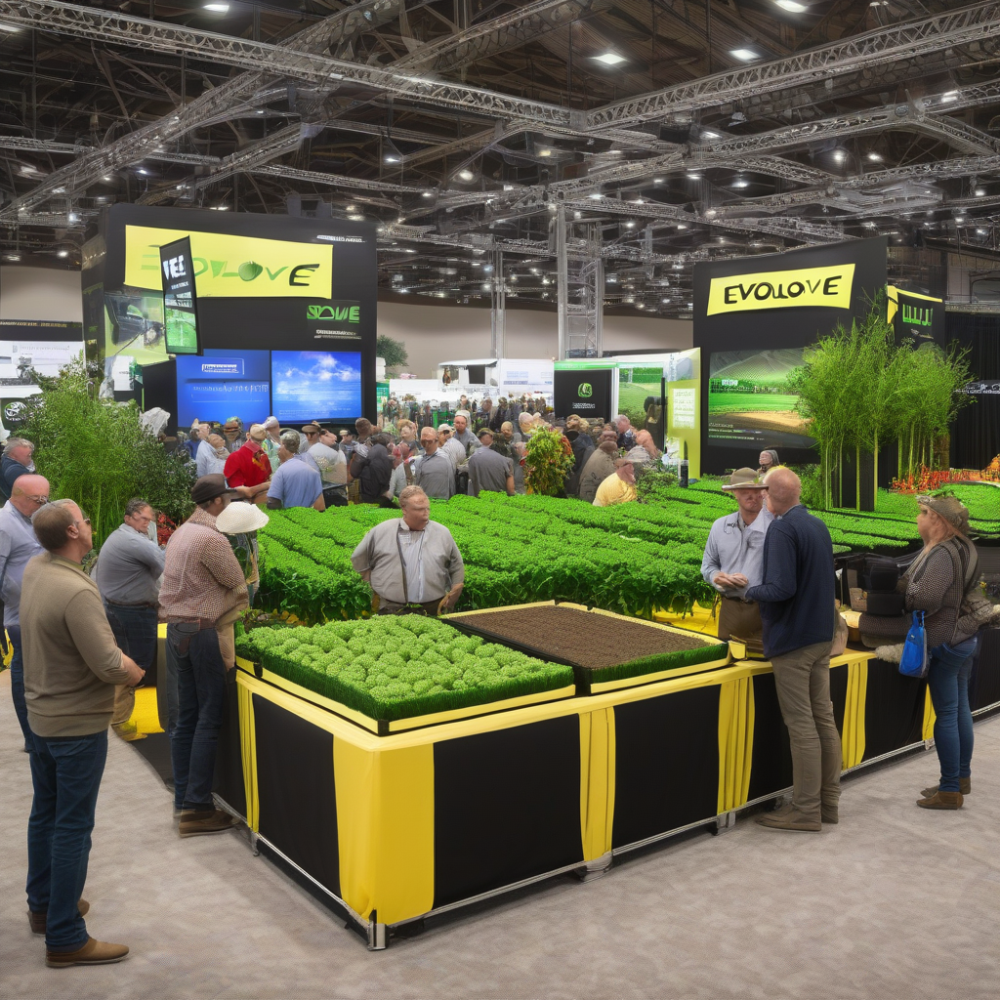

  0%|          | 0/25 [00:00<?, ?it/s]

Prompt 1: A car drives on a deserted highway at night with no signs of a toddler in sight before vanishing without a trace., ultra realistic, cinematic lighting, high detail, 4k, professional photography



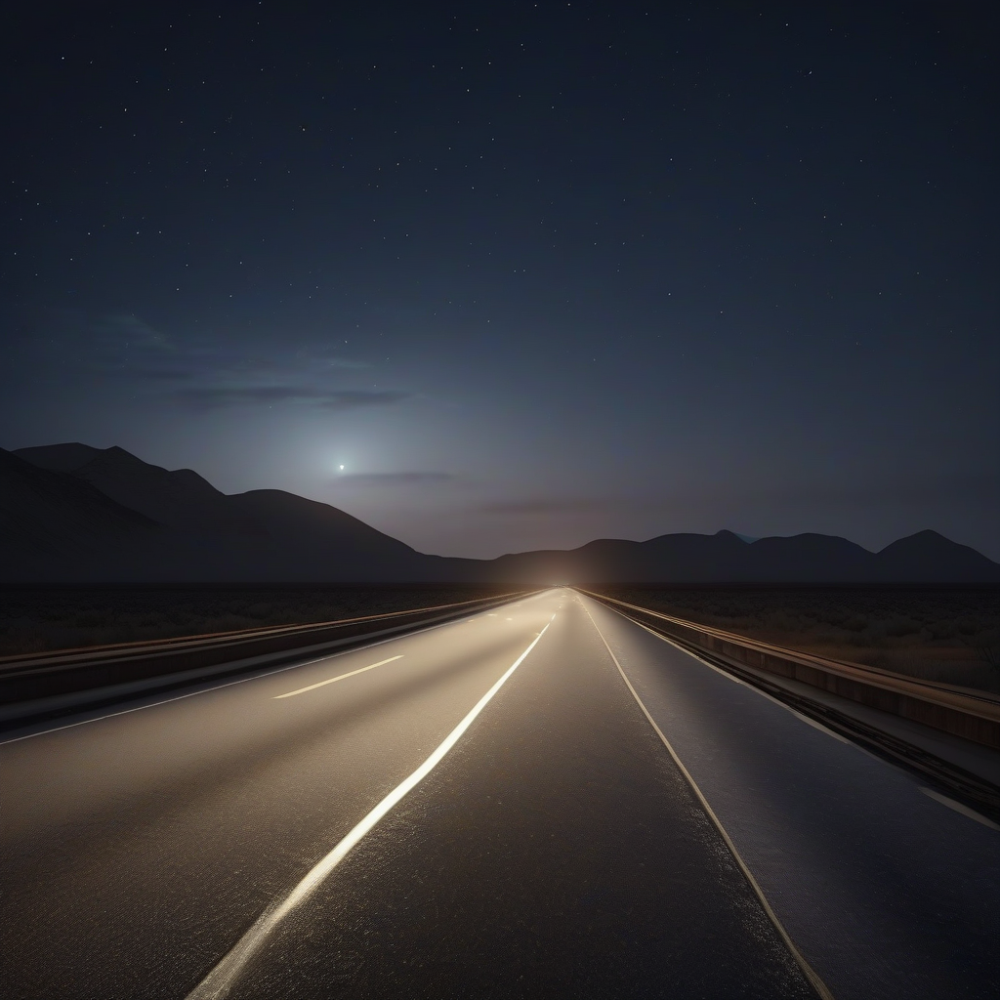

  0%|          | 0/25 [00:00<?, ?it/s]

Prompt 2: A shot of a packed stadium with excited fans cheering as the Laramie Rangers take to the field for their final home games of 2023., ultra realistic, cinematic lighting, high detail, 4k, professional photography



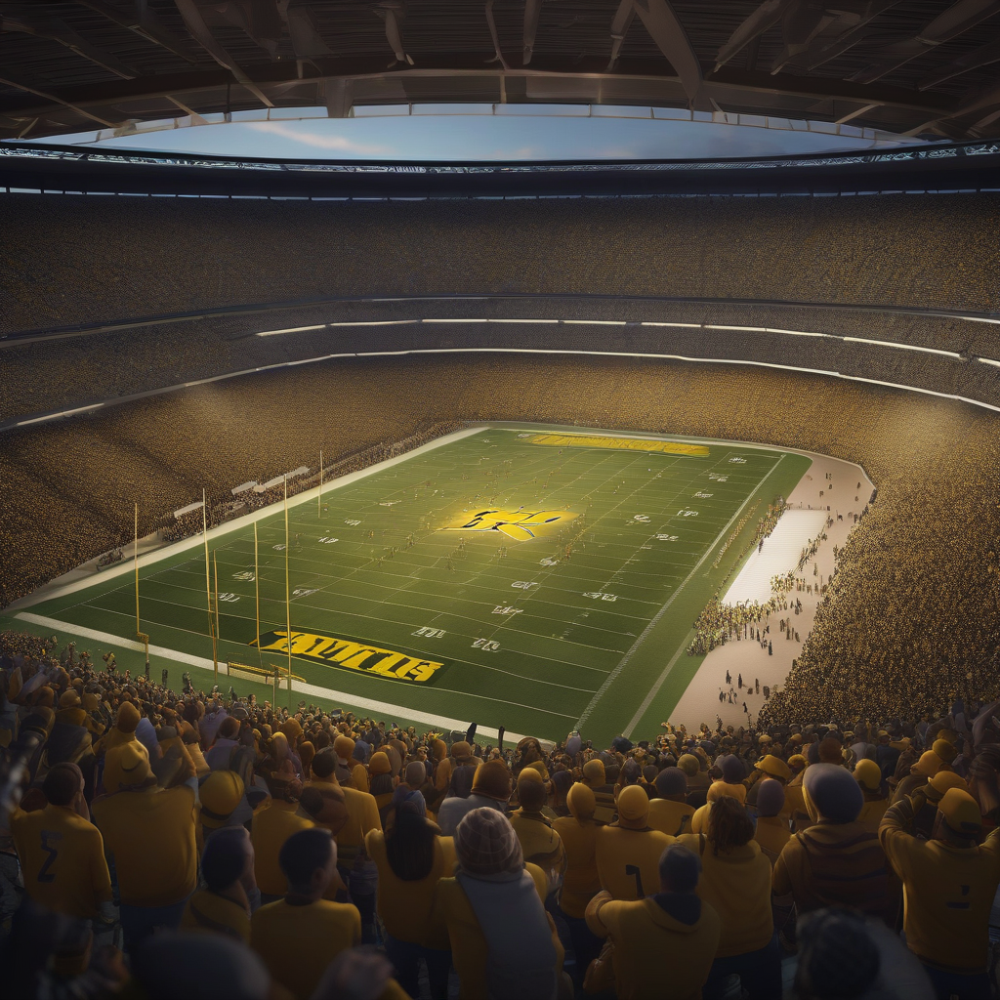

  0%|          | 0/25 [00:00<?, ?it/s]

Prompt 3: A runaway train with its brakes released suddenly slams into a stationary locomotive in British Columbia, causing a devastating derailment near Alberta., ultra realistic, cinematic lighting, high detail, 4k, professional photography



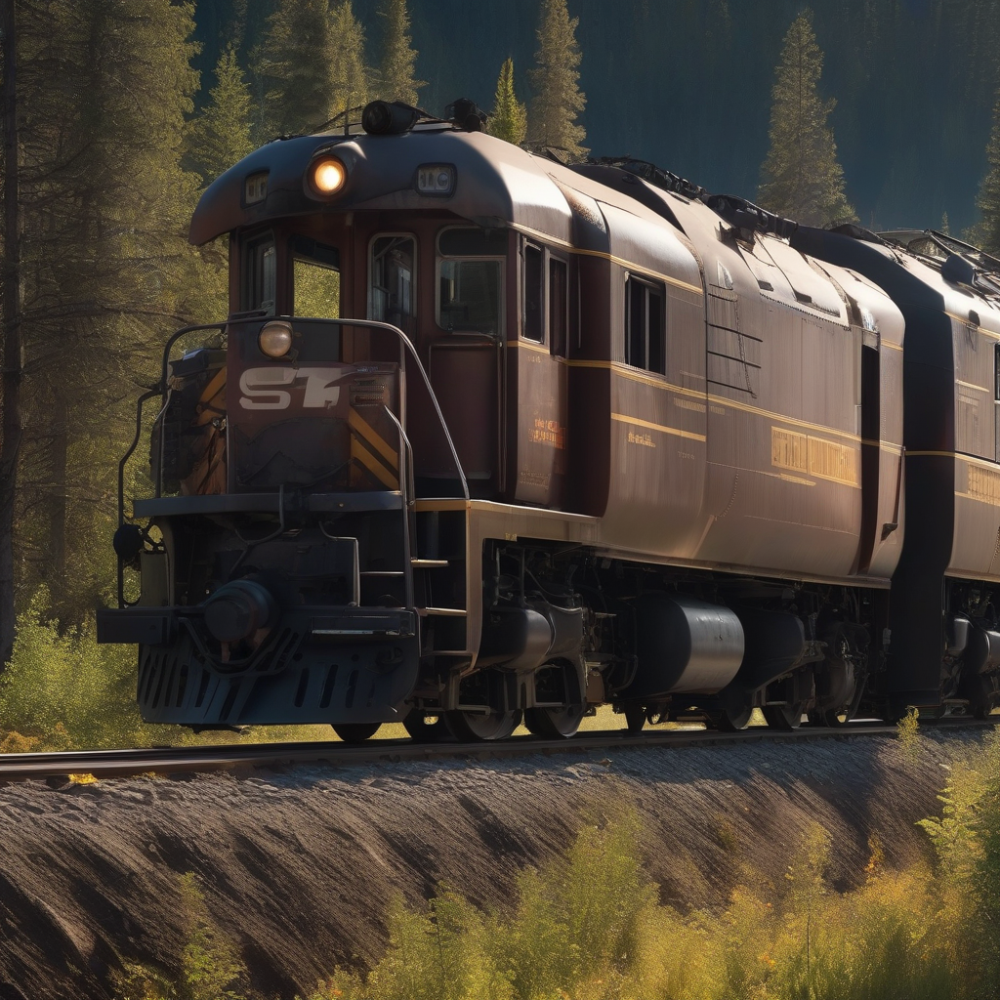

  0%|          | 0/25 [00:00<?, ?it/s]

Prompt 4: A determined English team with exceptional talent and strong chemistry facing a challenging match against France in the Women's World Cup 2023., ultra realistic, cinematic lighting, high detail, 4k, professional photography



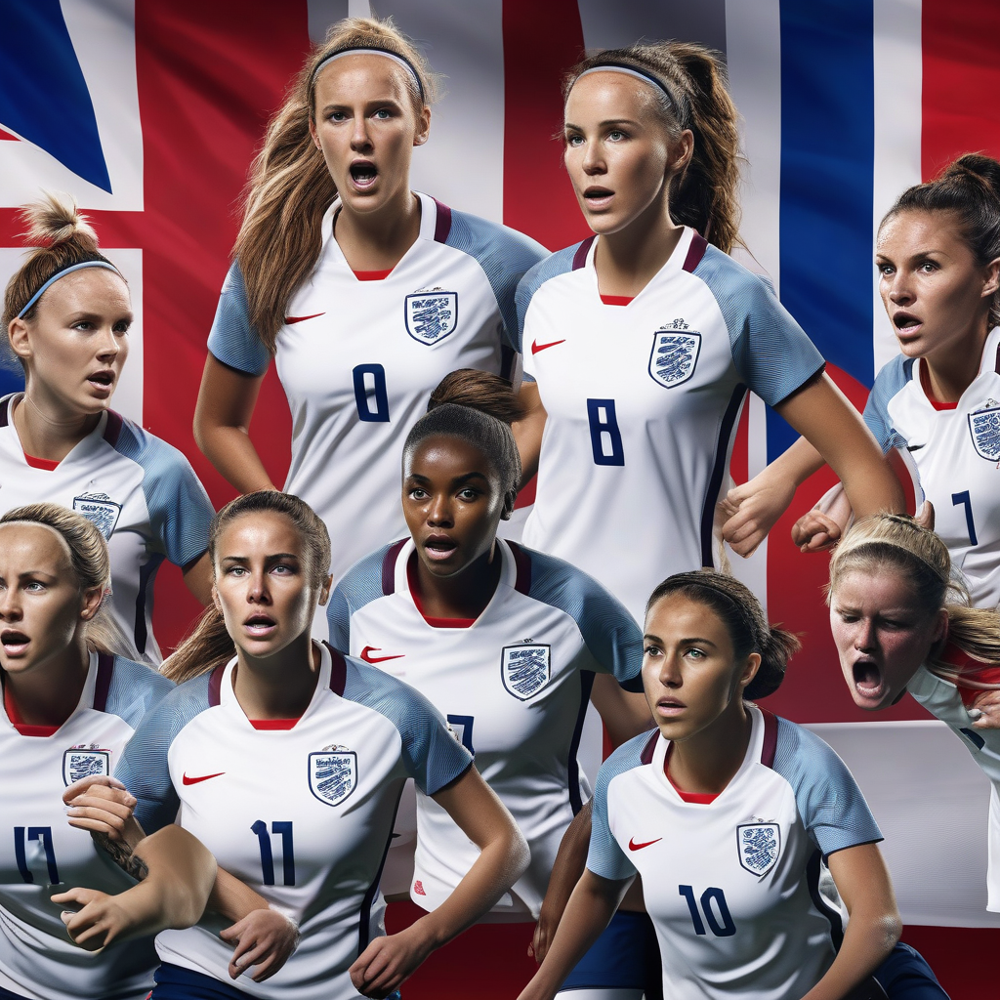

In [10]:
# Sample Image-Generation Testing
for i in range(5):
    prompt = news_df['enhanced_prompt'].iloc[i]

    image = pipe(
        prompt=prompt,
        negative_prompt="blurry, low quality, distorted, bad anatomy",
        num_inference_steps=25,
        guidance_scale=7.5
    ).images[0]

    print(f"Prompt {i}: {prompt}\n")
    display(image)

In [ ]:
# Final run for all rows
output_dir = "/content/drive/MyDrive/Colab Notebooks/Data/DLP_Project/Generated_Images"
os.makedirs(output_dir, exist_ok=True)

for i, row in tqdm(news_df.head(50).iterrows(), total=50):
    prompt = row['image_prompt']

    image = pipe(
        prompt=prompt,
        negative_prompt="blurry, low quality, distorted, bad anatomy",
        num_inference_steps=25,
        guidance_scale=7.5
    ).images[0]

    image.save(f"{output_dir}/{row['image_id']}.png")